In [1]:
# Importing all the required imports

from google.colab import drive
drive.mount('/content/drive')

# Removing Warnings
import warnings
warnings.filterwarnings('ignore') #Ignoring the warning messages

from PIL import Image
import os
import shutil
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from sklearn.preprocessing import LabelEncoder
from skimage.transform import resize

from sklearn.manifold import TSNE
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import MDS
from scipy.spatial import procrustes
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Mounted at /content/drive


In [2]:
# Deleting the 'Extracted Images' directory to avoid duplicate data
# shutil.rmtree('/content/extracted_images')

In [3]:
import zipfile

# Extracting the required Zip File
google_drive_zip_path = '/content/drive/MyDrive/AML_HW3/Data_2.zip'

# Define the target directory to extract the contents
target_directory = '/content/extracted_images/'

# Creating the target directory if it doesn't exist
!mkdir -p {target_directory}

# Extracting the contents of the zip file to the target_directory
with zipfile.ZipFile(google_drive_zip_path, 'r') as zip_ref:
   zip_ref.extractall(target_directory)

In [4]:
# Deleting all the un-required folders from the extracted folder

extracted_directory = '/content/extracted_images'

# Deleting all the folders except the following from the above directory

required_folders = ['rps-cv-images']

# Getting a list all items in the directory
all_folders = os.listdir(extracted_directory)

# Delete items that are not in the list of required folders
for folder in all_folders:
    item_path = os.path.join(extracted_directory, folder)
    if folder not in required_folders and os.path.isdir(item_path):
        shutil.rmtree(item_path)

# Verify the result
print("Remaining folders:")
remaining_folders = os.listdir(extracted_directory)
print(remaining_folders)


Remaining folders:
['README_rpc-cv-images.txt', 'rps-cv-images']


In [5]:
# Counting the number of Images in each Folder

folder_path = '/content/extracted_images/rps-cv-images'
RP = ['rock', 'paper', 'scissors']
# Count the number of image files in the folder
for folder in RP:
  fp = os.path.join(folder_path, folder)
  image_count = len([f for f in os.listdir(fp) if f.endswith(('.jpg', '.png'))])
  print(f"Number of images in the {folder}: {image_count}")


Number of images in the rock: 726
Number of images in the paper: 712
Number of images in the scissors: 750


In [6]:
# Renaming the image names in each folder
# Adding the lables ('P' - Paper, 'R' - Rock, 'S' - Scissors before every file name)

# Renaming Rock Images
folder_path = '/content/extracted_images/rps-cv-images/rock'
a = 0

# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.png'):  # Adjust the file extension as needed
        current_filepath = os.path.join(folder_path, filename)

        # Define your renaming logic here
        new_filename = "R_" + str(a) + ".png" #filename

        # Create the new file path
        new_filepath = os.path.join(folder_path, new_filename)

        # Rename the file
        os.rename(current_filepath, new_filepath)
        a = a + 1

print("Rock Images renaming completed.")

# Renaming Paper Images
folder_path = '/content/extracted_images/rps-cv-images/paper'
b = 0
# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.png'):  # Adjust the file extension as needed
        current_filepath = os.path.join(folder_path, filename)

        # Define your renaming logic here
        new_filename = "P_" + str(b) + ".png"

        # Create the new file path
        new_filepath = os.path.join(folder_path, new_filename)

        # Rename the file
        os.rename(current_filepath, new_filepath)
        b = b + 1

print("Paper Images renaming completed.")

# Renaming Scissors Images
folder_path = '/content/extracted_images/rps-cv-images/scissors'
c = 0
# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.png'):  # Adjust the file extension as needed
        current_filepath = os.path.join(folder_path, filename)

        # Define your renaming logic here
        new_filename = "S_" + str(c) + ".png"

        # Create the new file path
        new_filepath = os.path.join(folder_path, new_filename)

        # Rename the file
        os.rename(current_filepath, new_filepath)
        c = c + 1

print("Scissors Images renaming completed.")

Rock Images renaming completed.
Paper Images renaming completed.
Scissors Images renaming completed.


In [7]:
# Counting the number of Renamed Images in each Folder
folder_path = '/content/extracted_images/rps-cv-images'
RP = ['rock', 'paper', 'scissors']
# Count the number of image files in the folder
for folder in RP:
  fp = os.path.join(folder_path, folder)
  image_count = len([f for f in os.listdir(fp) if f.endswith(('.jpg', '.png'))])
  print(f"Number of renamed-images in the {folder}: {image_count}")

Number of renamed-images in the rock: 726
Number of renamed-images in the paper: 712
Number of renamed-images in the scissors: 750


In [8]:
# Splitting the Data into Train & Test Data
# Creating train & test data folders, if they do not exists
!mkdir -p {'/content/extracted_images/train'}
!mkdir -p {'/content/extracted_images/test'}

def split(main_directory, train_directory, test_directory, test_size=0.2, random_state=42):
    # Assigning output directories
    train_directory = train_directory
    test_directory = test_directory

    # Gettin a list of all image files in the main directory
    image_files = [f for f in os.listdir(main_directory) if f.endswith('.png')]

    # Split the image files into train and test sets
    train_files, test_files = train_test_split(image_files, test_size=test_size, random_state=random_state)

    # Coppying the files to the respective folders
    for train_file in train_files:
        shutil.copy(os.path.join(main_directory, train_file), os.path.join(train_directory, train_file))

    for test_file in test_files:
        shutil.copy(os.path.join(main_directory, test_file), os.path.join(test_directory, test_file))


In [9]:
# Splitting images from each folder (rock, paper, scissors):
# Splitting Rock
main_directory = '/content/extracted_images/rps-cv-images/rock'
train_directory = '/content/extracted_images/train'
test_directory = '/content/extracted_images/test'
split(main_directory, train_directory, test_directory, test_size=0.2, random_state=42)
print("Rock Images have been split.")

# Splitting Paper
main_directory = '/content/extracted_images/rps-cv-images/paper'
train_directory = '/content/extracted_images/train'
test_directory = '/content/extracted_images/test'
split(main_directory, train_directory, test_directory, test_size=0.2, random_state=42)
print("Paper Images have been split.")

# Splitting Scissors
main_directory = '/content/extracted_images/rps-cv-images/scissors'
train_directory = '/content/extracted_images/train'
test_directory = '/content/extracted_images/test'
split(main_directory, train_directory, test_directory, test_size=0.2, random_state=42)
print("Scissors Images have been split.")

Rock Images have been split.
Paper Images have been split.
Scissors Images have been split.


In [10]:
# Extracting the category information from the filenames - for training & test data
cat_test, cat_train = [filename[0] for filename in os.listdir('/content/extracted_images/train')], [filename[0] for filename in os.listdir('/content/extracted_images/test')]
categories = list(set(cat_test + cat_train))
print(f" The total number of categories in test & train data is {len(categories)}, and the categories present are - \n\t{categories}")

# Counting the number of images in Train & Test folder & the number of images from each lable
folder_path = '/content/extracted_images'
RP = ['train', 'test']
# Count the number of image files in the folder
for folder in RP:
  fp = os.path.join(folder_path, folder)
  image_count = len([f for f in os.listdir(fp) if f.endswith(('.jpg', '.png'))])
  print(f"\nTotal Number of images in the {folder} folder: {image_count}")
  # Counting the occurrences of every lable in the list
  for c in np.unique([filename[0] for filename in os.listdir(os.path.join('/content/extracted_images/', folder))]):
    #categories.count("I")
    # Print the result
    print(f"\tThe lable {c} occurs {[filename[0] for filename in os.listdir(os.path.join('/content/extracted_images', folder))].count(c)} times in the {folder} folder.")

 The total number of categories in test & train data is 3, and the categories present are - 
	['S', 'R', 'P']

Total Number of images in the train folder: 1749
	The lable P occurs 569 times in the train folder.
	The lable R occurs 580 times in the train folder.
	The lable S occurs 600 times in the train folder.

Total Number of images in the test folder: 439
	The lable P occurs 143 times in the test folder.
	The lable R occurs 146 times in the test folder.
	The lable S occurs 150 times in the test folder.


<H2>From the above it can be seen that the test data is a representative of all the lables in the training dataset.</H2>

In [11]:
# Specify the folder path
folder_path = './extracted_images/train'
#folder_path = '/Users/malhardhopate/Desktop/IUB/Fall 2023/Applied Machine Learning/HW3/Q1/Data/360 Rocks'

# Initialize a list to store the image data
images = []

# Loop through the files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Open and load the image
        img = Image.open(os.path.join(folder_path, filename))
        new_size = (img.width // 2, img.height // 2)
        #resized_img = img.resize(new_size, Image.ANTIALIAS)
        resized_img = img.resize(new_size)
        # Convert the image to a numpy array
        img_data = np.array(resized_img)
        # Flatten the image into a 1D vector and append to the list
        images.append(img_data)

# 'images' now contains a list of flattened image data

print(f"The number of total images = {len(images)}")
print(f"The number of total categories = {len(categories)}")

# Counting the occurrences of every lable in the list
for c in np.unique([filename[0] for filename in os.listdir(folder_path)]):
    #categories.count("I")
    # Print the result
    print(f"\tThe lable {c} occurs {[filename[0] for filename in os.listdir(folder_path)].count(c)} times in the train folder.")

The number of total images = 1749
The number of total categories = 3
	The lable P occurs 569 times in the train folder.
	The lable R occurs 580 times in the train folder.
	The lable S occurs 600 times in the train folder.


In [12]:
# Flatten the 4D array into a 2D array (num_images, num_features)
images = np.stack(images) # Stacking the 'images' list along a new axis to create a new array
print(f"Original 'images' shape is: {images.shape}")
print("*"*100)

# Determining the Height, Width & Channels for rehaping the 'images' list
num_samples, height, width, channels = images.shape
images = images.reshape(num_samples, height * width * channels)
print(f"New shape for 'images' shape is: {images.shape}")
print("*"*100)

Original 'images' shape is: (1749, 100, 150, 3)
****************************************************************************************************
New shape for 'images' shape is: (1749, 45000)
****************************************************************************************************


# **Question 1: Apply PCA to the images. How many components do you need to preserve 95% of the variance?**

In [13]:
# Implementing PCA
pca = PCA()
pca.fit(images)

# Finding the number of Components required to preserve 95% of the variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_95_variance = np.argmax(cumulative_explained_variance >= 0.95) + 1

print(f"Number of components needed to preserve 95% of variance: {n_components_95_variance}")

Number of components needed to preserve 95% of variance: 229


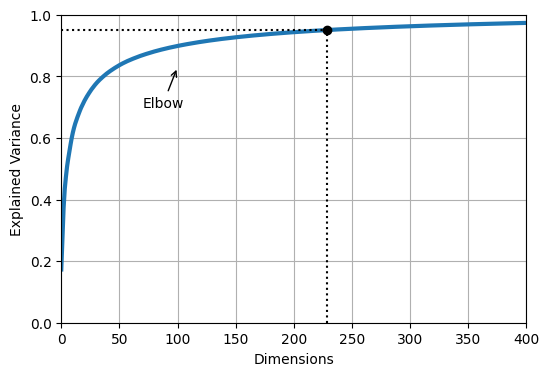

In [14]:
# extra code – this cell generates saves the Figure to represent the number of components needs to preserve 95% variance
plt.figure(figsize=(6, 4))
plt.plot(cumulative_explained_variance, linewidth=3)
plt.axis([0, 400, 0, 1])

# Adding Lables to Axis
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")

# Plotting Dotted line for the point
plt.plot([n_components_95_variance, n_components_95_variance], [0, 0.95], "k:")
plt.plot([0, n_components_95_variance], [0.95, 0.95], "k:")
plt.plot(n_components_95_variance, 0.95, "ko")
plt.annotate("Elbow", xy=(100, 0.83), xytext=(70, 0.7),
             arrowprops=dict(arrowstyle="->"))
plt.grid(True)
plt.show()

<H2>As seen from above, along with the figure, we can observe that the number of required components to preserve 95% variance is - 229.</H2>


<H1>Question 2</H1>

<H2>Plot 10 images of your choice in the original form (without PCA) and then plot their reconstruction (projection in the original space) after you kept 95% of variance using PCA.</H2>

In [15]:
# Checking the shape of the 'images' list
images.shape

(1749, 45000)

In [16]:
# Transforming the images while saving 95% of the variance
pca = PCA(0.95)
X_reduced = pca.fit_transform(images)
print(f"The shape of the reduced images is: {X_reduced.shape}")

The shape of the reduced images is: (1749, 229)


In [17]:
# Recovering and Reshaping the recovered images back to (num_images, height, width, channels)
X_recovered = pca.inverse_transform(X_reduced)
X_recovered = X_recovered.reshape(num_samples, height,width,channels)
print(f"The shape of the recovered images is: {X_recovered.shape}")

The shape of the recovered images is: (1749, 100, 150, 3)


In [18]:
X_recovered[1].shape

(100, 150, 3)

In [19]:
# Reshaping the 'images' to the original shape
images = images.reshape(num_samples, height,width,channels)
print(f"The shape of the reshaped original images is: {images.shape}")

The shape of the reshaped original images is: (1749, 100, 150, 3)


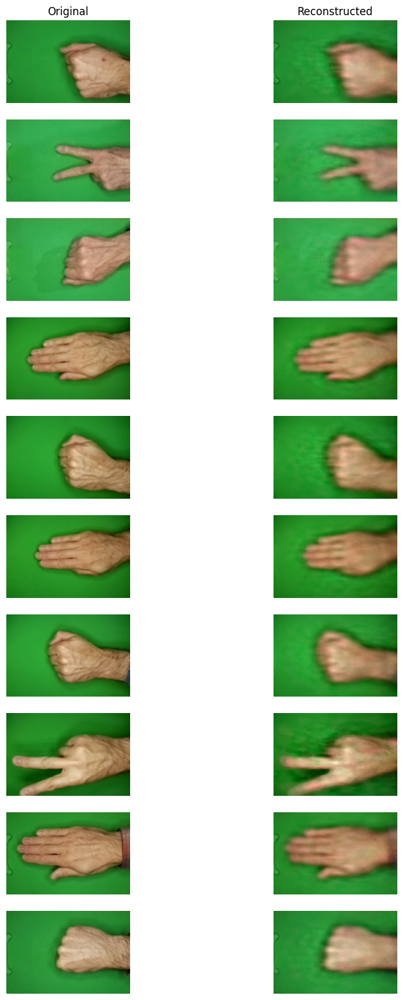

In [20]:
# Number of images to plot
num_images_to_plot = 10

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(num_images_to_plot, 2, figsize=(10, 20))
axes[0, 0].set_title("Original")
axes[0, 1].set_title("Reconstructed")
for i in range(num_images_to_plot):
    # Original image
    original_image = images[i].reshape(100, 150, 3)
    axes[i, 0].imshow(original_image.astype(int))
    axes[i, 0].axis("off")

    # Reconstructed image
    reconstructed_image = X_recovered[i].reshape(100, 150, 3)
    axes[i, 1].imshow(reconstructed_image.astype(int))
    axes[i, 1].axis("off")

plt.show()

<H3>The abover figure plots the original figures again the recovered images after saving 95% of the Variance.</H3>

<H1>Question 3</H1>

<H2>Each of the images belongs to one of three rock categories. The category is indicated by the first letter in the filename (R, P & S). We will now try to see if the visualization can help us identify different clusters.</H2>

In [21]:
# Checking the shape of the 'images' variable
images.shape

(1749, 100, 150, 3)

<H2>(A): Use PCA to reduce dimensionality to only 2 dimensions. How much of the variance is explained with the first two principal components?</H2>

In [22]:
# Implementing PCA while keeping only 2 components
pca = PCA(n_components=2)
%time X2D = pca.fit_transform(images.reshape(num_samples, height * width * channels))

print(f"\nVariance explained by each on the 2 principle components that were kept is: \n\t {pca.explained_variance_ratio_}")
print(f"\n\tThe variance explained by the 1st dimension is: {round(pca.explained_variance_ratio_[0],2)*100}%")
print(f"\tThe variance explained by the 2nd dimension is: {round(pca.explained_variance_ratio_[1],2)*100}%")

print(f"\nThe total variance explained by the 2 principle components is: {round(sum(pca.explained_variance_ratio_),2)*100}%")
print(f"The variance LOST by keeping only 2 principle components is: {round(1-sum(pca.explained_variance_ratio_),2)*100}%")

CPU times: user 6.39 s, sys: 2.02 s, total: 8.41 s
Wall time: 4.58 s

Variance explained by each on the 2 principle components that were kept is: 
	 [0.17287046 0.1028048 ]

	The variance explained by the 1st dimension is: 17.0%
	The variance explained by the 2nd dimension is: 10.0%

The total variance explained by the 2 principle components is: 28.000000000000004%
The variance LOST by keeping only 2 principle components is: 72.0%


<H2>(B): Plot a 2D scatter plot of the images spanned by the first two principal components. Each image will be represented with a dot. Make the color of the dot correspond to the image category (so you will have three different colors). Then add some rock images to the visualization to better understand what features in the images are accounting for the majority of variance in the data (your visualization should look similar to the one after line 71 in this file https://github.com/ageron/handson-ml3/blob/main/08_dimensionality_reduction.ipynbLinks to an external site. but with images of rocks instead of MNIST digits). Repeat the process and create the same type of plots for t-SNE, LLE and MDS.</H2>

<H2>PCA Plot</H2>

Default Colormap: viridis


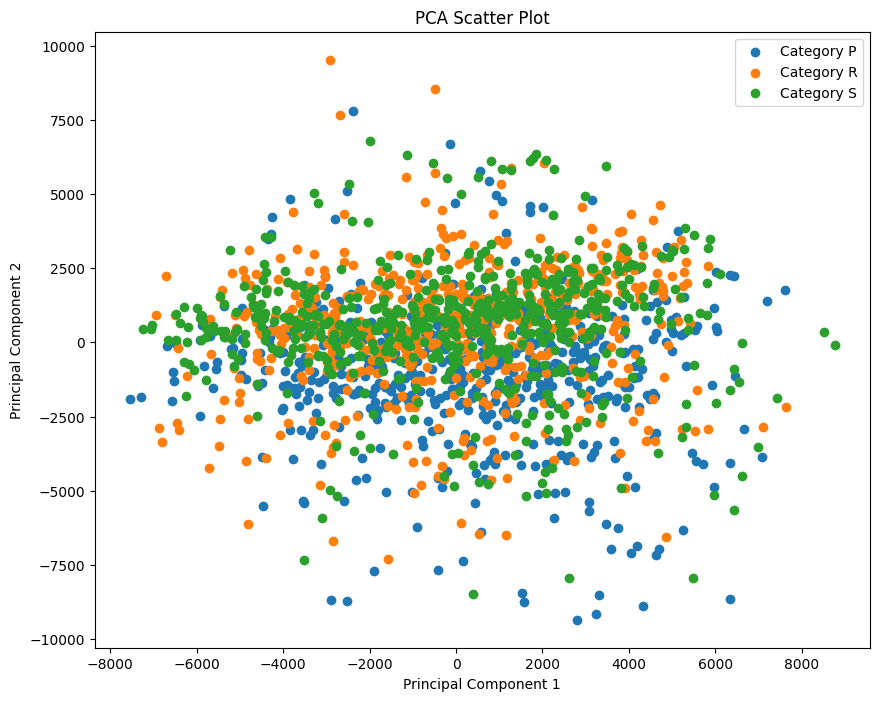

In [23]:
from matplotlib.cm import get_cmap
# Create a scatter plot with the 2 principle components
categories = [filename[0] for filename in os.listdir('/content/extracted_images/train')]
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X2D[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], label=f'Category {category}')
    # Getting the default 'cmap' assigned by mat plt
    default_cmap = get_cmap()

# Print the name of the default colormap
print("Default Colormap:", default_cmap.name)

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

<H2>Plot with Image as Lables</H2>

In [24]:
# Creating a function to plot rock images on the graph
def plot_rocks(X, rock_categories, min_distance=0.04, rock_images=None, figsize=(13, 10),image_size=(50,50)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the rocks plotted so far.
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet

    label_encoder = LabelEncoder()
    encoded_rock_categories = label_encoder.fit_transform(rock_categories)

    unique_rock_categories = np.unique(encoded_rock_categories)
    for category in unique_rock_categories:
        category_indices = np.where(encoded_rock_categories == category)
        category_images = X_normalized[category_indices]
        plt.scatter(category_images[:, 0], category_images[:, 1],
                    cmap="binary",
                    s=200, label="Category "+label_encoder.inverse_transform([category])[0])

    #Adding Legend
    plt.legend(fontsize=25, loc='best')

    plt.axis("off")
    ax = plt.gca()  # get current axes

    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if rock_images is None:
                category_label = label_encoder.inverse_transform([encoded_rock_categories[index]])[0]
                plt.text(image_coord[0], image_coord[1], str(category_label),
                         cmap="binary",
                         fontdict={"weight": "bold", "size": 16})
            else:
                rock_image = rock_images[index].reshape(100, 150, 3)
                rock_image = resize(rock_image, image_size, anti_aliasing=True)
                imagebox = AnnotationBbox(OffsetImage(rock_image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)


Text(0.5, 1.0, 'PCA Plot with Images')

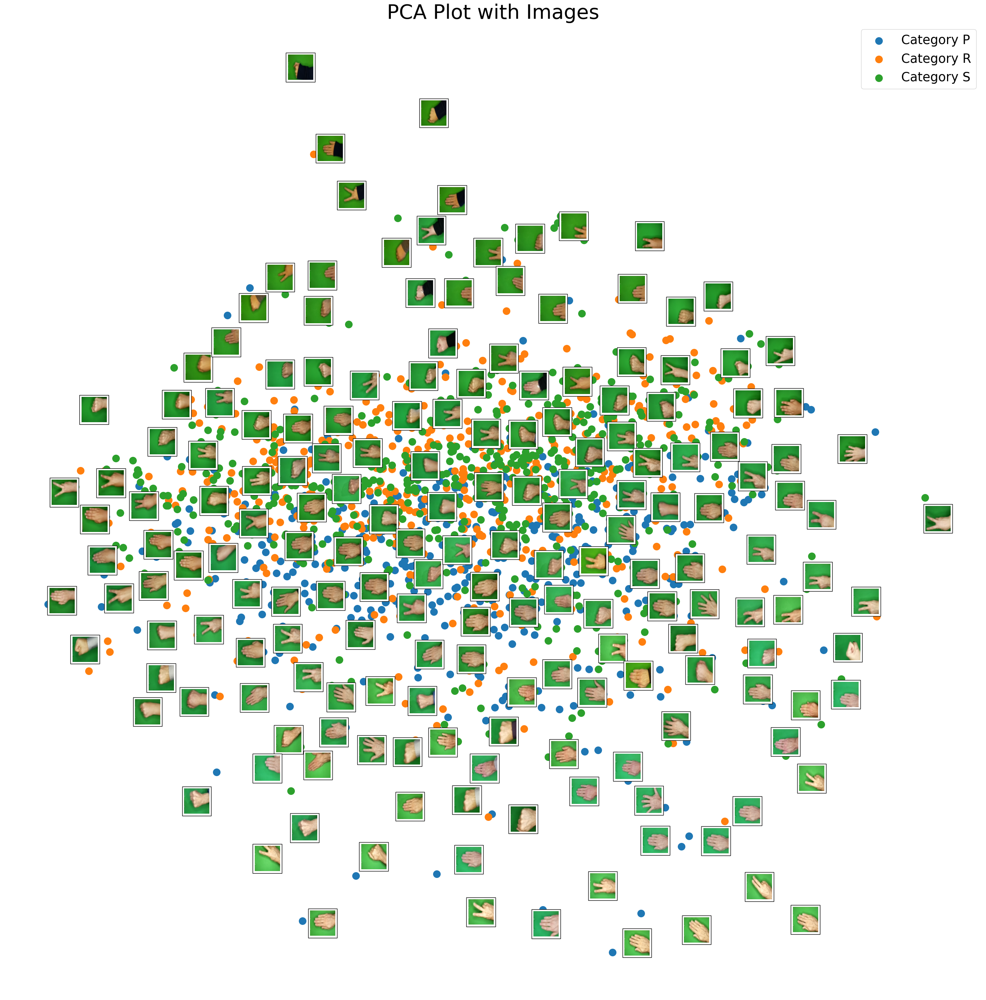

In [25]:
# Plotting the required plot
plot_rocks(X2D,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('PCA Plot with Images', fontsize=40)

<H2>T-SNE Plot</H2>

CPU times: user 38.8 s, sys: 1.79 s, total: 40.6 s
Wall time: 28.3 s


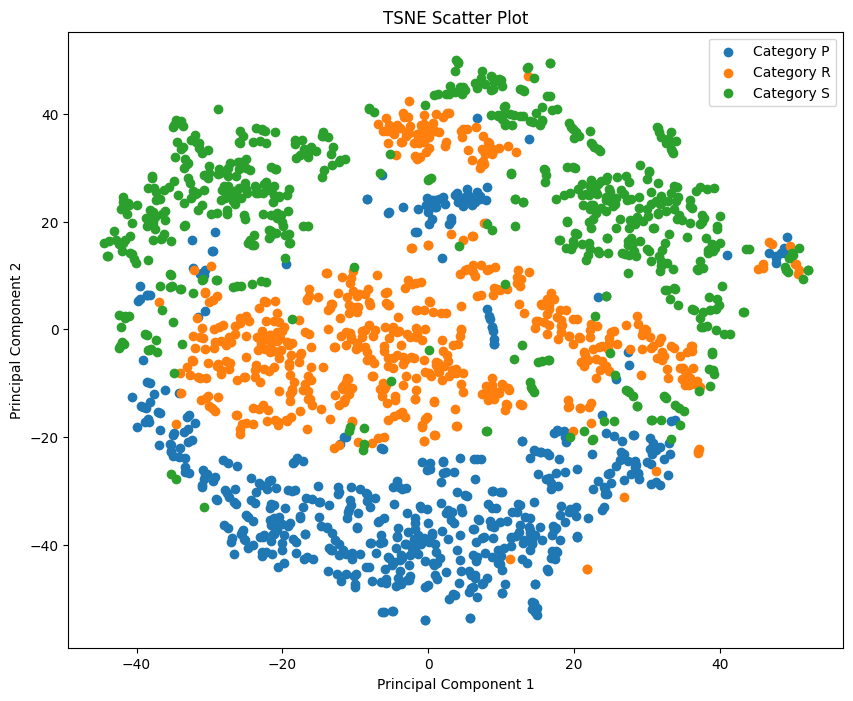

In [26]:
# Perform t-SNE to reduce the data to 2 dimensions
tsne = TSNE(n_components=2, random_state=0)
%time X_tsne = tsne.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_tsne[np.array(categories) == category]
    #plt.scatter(category_images[:, 0], category_images[:, 1], c=color, label=f'Category {category}')
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('TSNE Scatter Plot')
plt.legend(loc='best')

# Show the plot
plt.show()

Text(0.5, 1.0, 'T-SNE Plot with Rock Images')

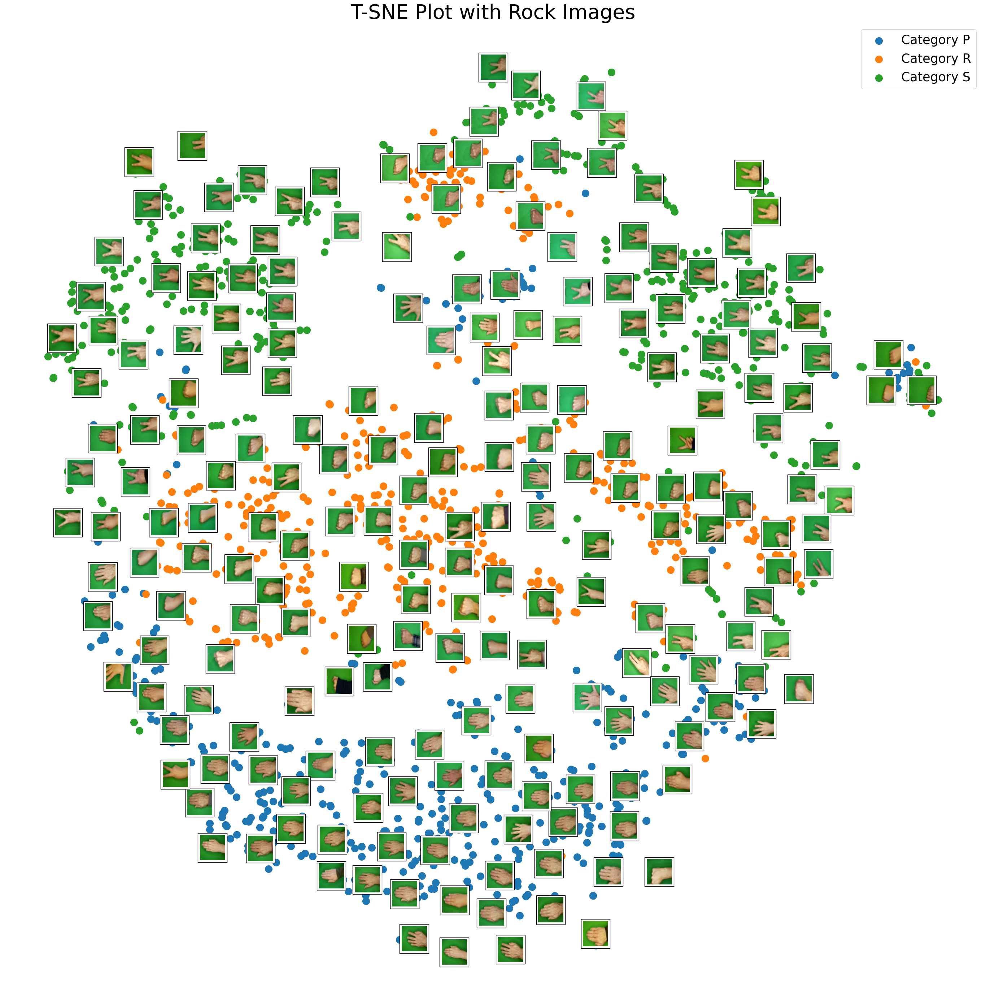

In [27]:
# Plotting the required plot
plot_rocks(X_tsne,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('T-SNE Plot with Rock Images', fontsize=40)

<H2>LLE Plot</H2>

CPU times: user 12.2 s, sys: 363 ms, total: 12.5 s
Wall time: 10.1 s


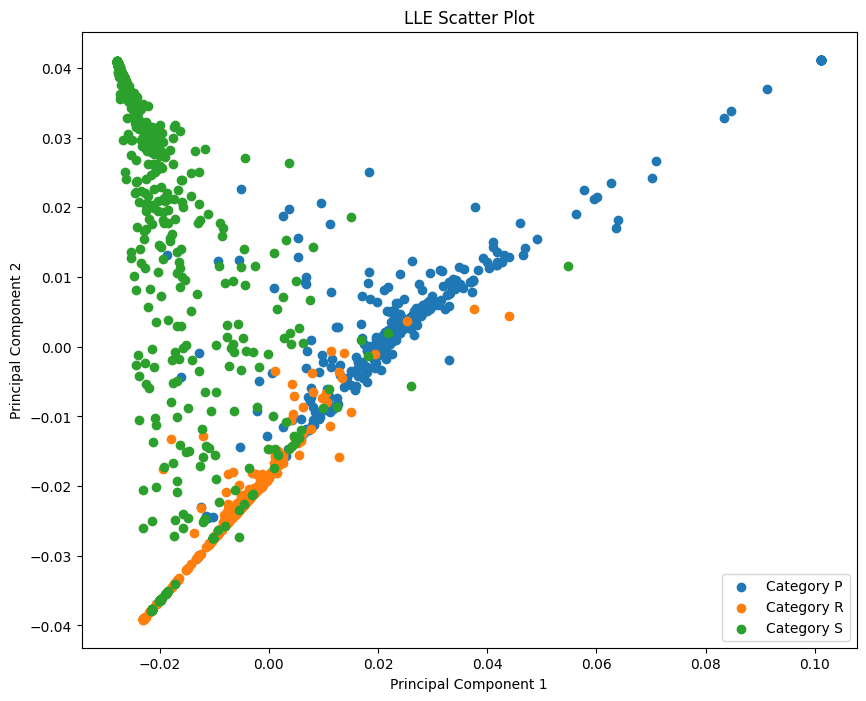

In [28]:
# Perform LLE to reduce the data to 2 dimensions
lle = LocallyLinearEmbedding(n_components=2, n_neighbors=5, random_state=0)
%time X_lle = lle.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_lle[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('LLE Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'LLE Plot with Rock Images')

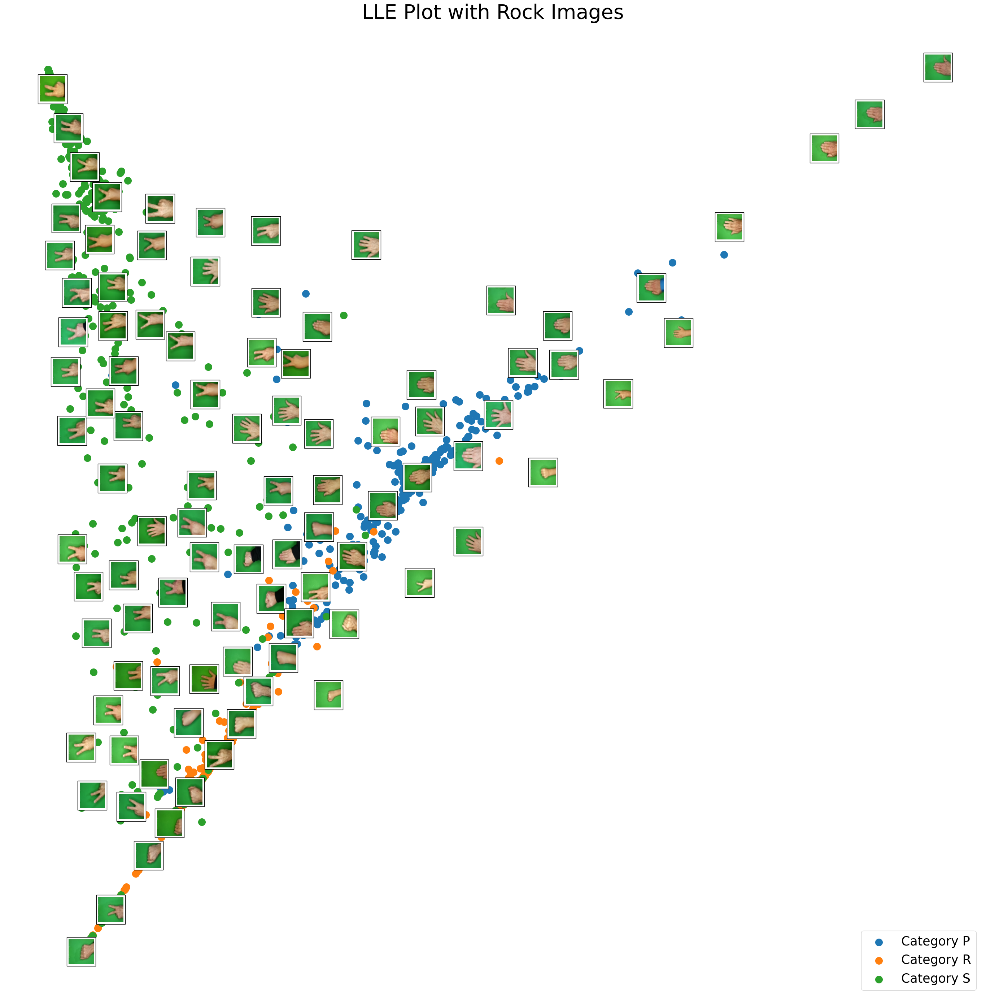

In [29]:
# Plotting the required plot
plot_rocks(X_lle,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('LLE Plot with Rock Images', fontsize=40)

<H2>MDS Plot</H2>

CPU times: user 1min 29s, sys: 52.8 s, total: 2min 22s
Wall time: 1min 29s


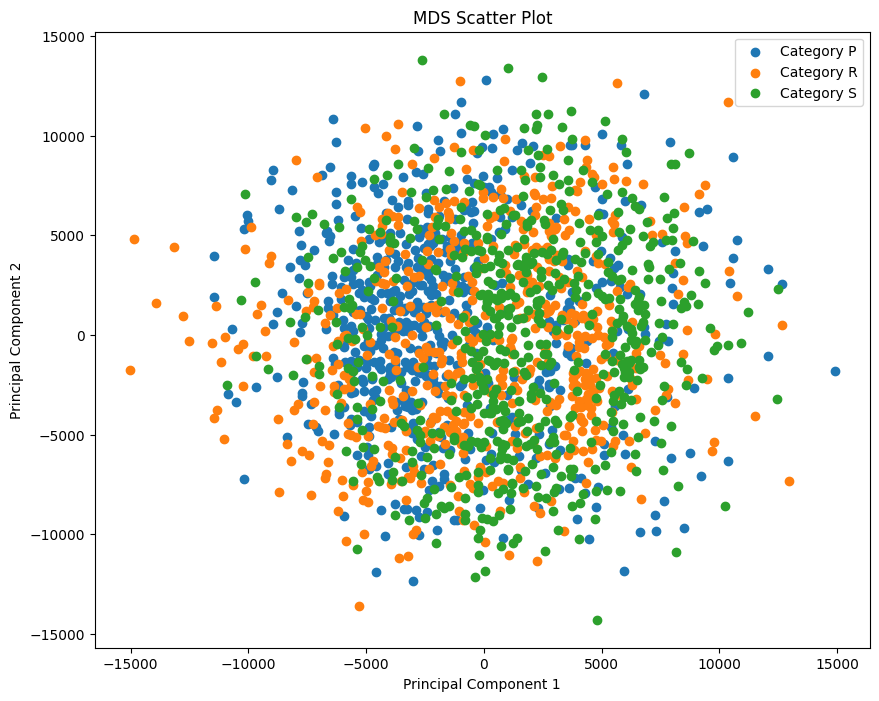

In [30]:
# Perform MDS to reduce the data to 2 dimensions
mds = MDS(n_components=2, random_state=0)
%time X_mds = mds.fit_transform(images.reshape(num_samples, height * width * channels))

# Create a scatter plot
plt.figure(figsize=(10, 8))
for category in sorted(set(categories)):
    # Select images and their corresponding labels for the current category
    category_images = X_mds[np.array(categories) == category]
    plt.scatter(category_images[:, 0], category_images[:, 1], cmap="binary", label=f'Category {category}')

# Set labels and legend
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(loc='best')
plt.title('MDS Scatter Plot')
# Show the plot
plt.show()


Text(0.5, 1.0, 'MDS Plot with Rock Images')

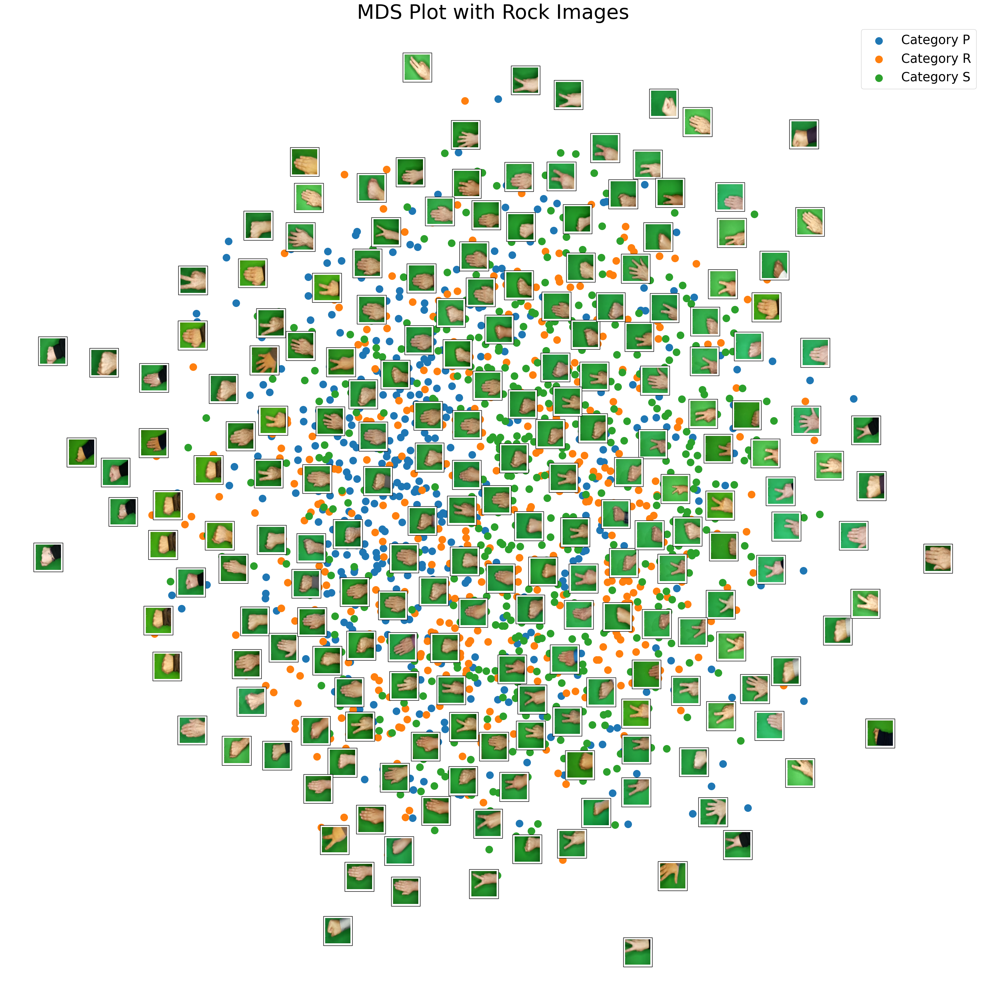

In [31]:
# Plotting the required plot
plot_rocks(X_mds,categories,rock_images=images.reshape(num_samples, height * width * channels),figsize=(35, 35))
plt.title('MDS Plot with Rock Images', fontsize=40)


<H2>(C): Which of the visualizations do you prefer?</H2>

<H2>Answer - <br>

- T-SNE produces the best visualization in the above, as we can clearly observe some clustering. Whereas, no distinct clusters are observed in PCA, LLE, or MDS
- The PCA, and MDS plot similar scatter plots. While the LLE does not do a good job as there are many datapoints from different categories being overlapped.
- Therefore, T-SNE by far produces the graph which provides best clustering outcome, as it is able to display some distinct clustering and some overlapping datapoints.
 </H2>

<H2>Question 4</H2>

<H2>Now let's see if these dimensionality reduction techniques can give us similar features to those that humans use to judge the images. File mds_360.txt contains 8 features for each of the images (rankings are in the same order as the images in  '360 Rocks' folder. Run PCA, t-SNE, LLE and MDS to reduce the dimensionality of the images to 8. Then, compare those image embeddings with the ones from humans that are in the mds_360.txt file. Use Procrustes analysis to do the comparison (here is one example of how to do that mtx1, mtx2, disparity = procrustes(matrix_with_human_data, matrix_with_pca_embeddings_data). Here matrix_with_human_data and matrix_with_pca_embeddings_data should be 360 by 8. disparity will tell you the difference in the data. Report disparity for each of the four dimensionality reduction methods. Compute the correlation coefficient between each dimension of mtx1 and mtx2 for each of the four methods - display results in a table.</H2>

<H2> Not required for Personal Dataset </H2>



<H1>Question 5</H1>

<H2>Cluster the 360 images using K-Means.</H2>

<H2>(A)To speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.</H2>

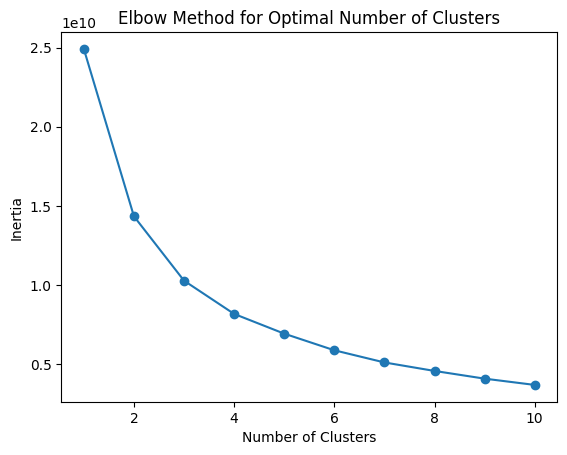

In [32]:
# Conducting PCA to reduce the dimensions to 2
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(images.reshape(num_samples, height * width * channels))

# Determine the optimal number of clusters using the K-Means++ method
inertia = []
for n_clusters in range(1, 11):  # You can adjust the range as needed
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=0)
    kmeans.fit(X_reduced)
    inertia.append(kmeans.inertia_)

# Plot the elbow method to determine the optimal number of clusters
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

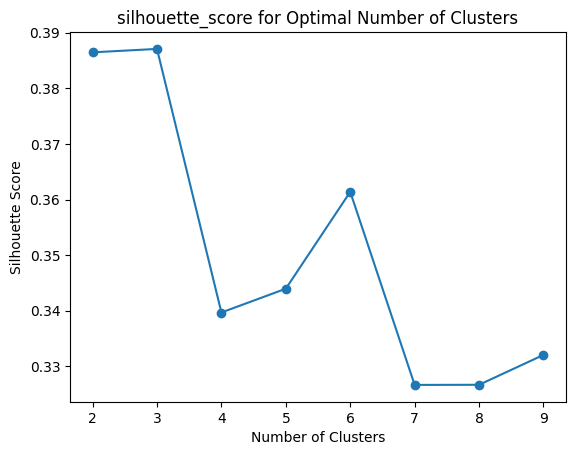

In [33]:
# Determining the number of optimum clusters using silhouette_score
sil_coeff = []
for n_clusters in range(2, 10):  # You can adjust the range as needed
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=0)
    kmeans.fit(X_reduced)
    sil_coeff.append(silhouette_score(X_reduced, kmeans.labels_))

# Plot the silhouette_score to determine the optimal number of clusters
plt.plot(range(2, 10), sil_coeff, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('silhouette_score for Optimal Number of Clusters')
plt.show()

<H2> Based on the above graphs, the optimum number of clusters obtained from 'K-means++' is 3</H2>

In [34]:
# Based on the above graphs, we choose the optimal number of clusters
optimal_n_clusters = 3  # Adjust this based on the plot

# Apply K-Means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_n_clusters, init='k-means++', random_state=0)
kmeans.fit(X_reduced)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
print (f"The centroids are -\n {centroids}")

The centroids are -
 [[-2804.79053915    93.90578552]
 [ 2119.6021563   1361.86022562]
 [ 1951.51133188 -3184.10614678]]


<H2>(B) Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question 3  (I, M and S). </H2>

In [35]:
# Defining functions to plot decision boundaries, centroids, and data
def plot_data(X, cat, c="viridis"):
    for c in sorted(set(cat)):
        cat_img = X[np.array(cat) == c]
        plt.scatter(cat_img[:, 0], cat_img[:, 1], cmap=c, s=10, label="Category " + c)
    plt.legend(loc='best', fontsize=10)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, cat, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X, cat, c="viridis")
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)


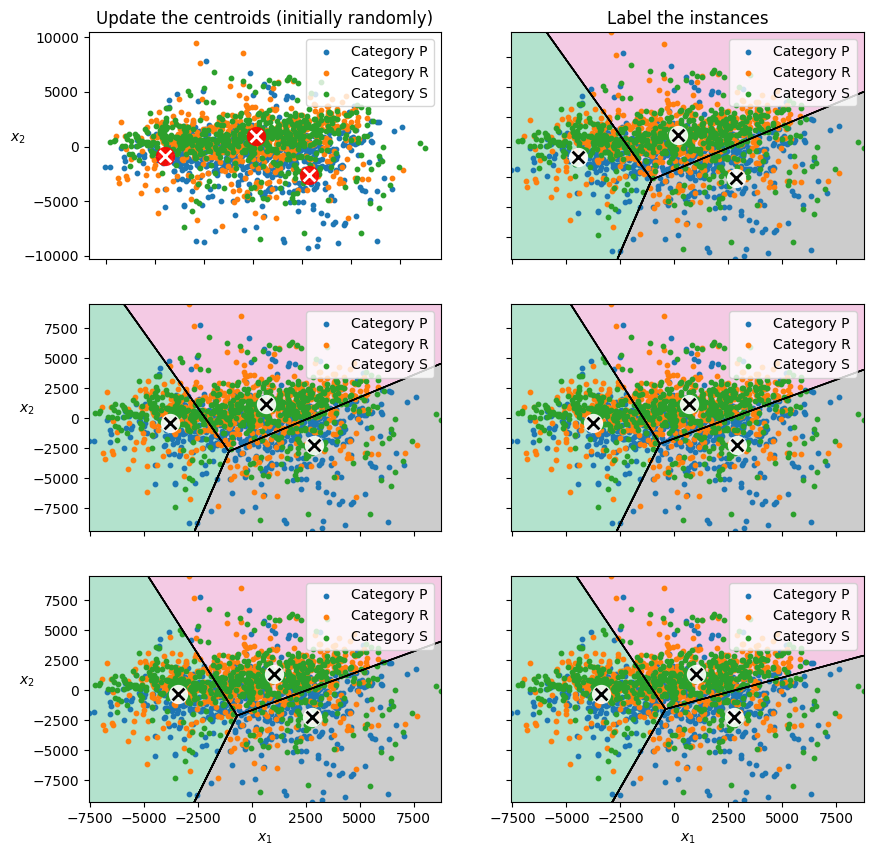

In [36]:
# Running 'k-means++' Clustering through many iteration
kmeans_iter1 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=1,
                      random_state=5)
kmeans_iter2 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=2,
                      random_state=5)
kmeans_iter3 = KMeans(n_clusters=optimal_n_clusters, init="k-means++", n_init=1, max_iter=3,
                      random_state=5)
kmeans_iter1.fit(X_reduced)
kmeans_iter2.fit(X_reduced)
kmeans_iter3.fit(X_reduced)

plt.figure(figsize=(10, 10))

plt.subplot(321)
plot_data(X_reduced, categories)
plot_centroids(kmeans_iter1.cluster_centers_, circle_color='r', cross_color='w')
plt.ylabel("$x_2$", rotation=0)
plt.tick_params(labelbottom=False)
plt.title("Update the centroids (initially randomly)")

plt.subplot(322)
plot_decision_boundaries(kmeans_iter1, X_reduced, categories, show_xlabels=False,
                         show_ylabels=False)
plt.title("Label the instances")

plt.subplot(323)
plot_decision_boundaries(kmeans_iter1, X_reduced, categories, show_centroids=False,
                         show_xlabels=False)
plot_centroids(kmeans_iter2.cluster_centers_)

plt.subplot(324)
plot_decision_boundaries(kmeans_iter2, X_reduced, categories, show_xlabels=False,
                         show_ylabels=False)

plt.subplot(325)
plot_decision_boundaries(kmeans_iter2, X_reduced, categories, show_centroids=False)
plot_centroids(kmeans_iter3.cluster_centers_)

plt.subplot(326)
plot_decision_boundaries(kmeans_iter3, X_reduced, categories, show_ylabels=False)

plt.show()

<H2> The above graphs check whether the data point change clusters with multiple iterations, for the optimum number of clusters. It can be seen that though the centroid location changes minutely, the data clustering does not change significantly.</H2>


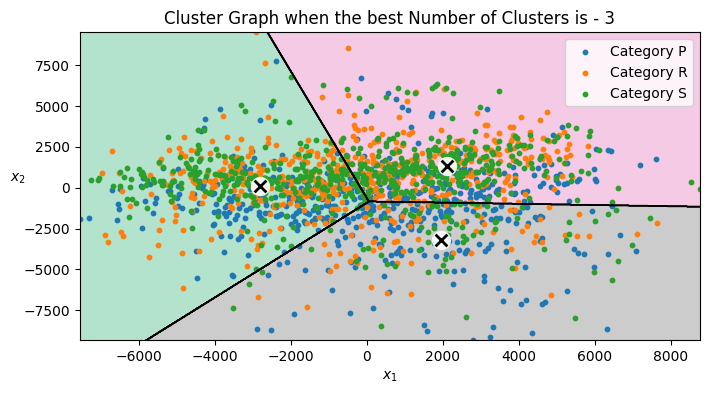

In [37]:
# Plotting the best Clustering Graph
plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, X_reduced, categories)
plt.title(f"Cluster Graph when the best Number of Clusters is - {optimal_n_clusters}")
plt.show()


<H1>Question 6</H1>

<H2>Cluster the 360 images using EM.</H2>

<H2>(A) Same as in the previous question, to speed up the algorithm, use PCA to reduce the dimensionality of the dataset to two. Determine the number of clusters using one of the techniques we discussed in class.</H2>

In [38]:
# Conducting PCA to reduce the dimensions to 2
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(images.reshape(num_samples, height * width * channels))
print(f"Original Image shape = {images.shape}")
print(f"Reduced Size = {X_reduced.shape}")


Original Image shape = (1749, 100, 150, 3)
Reduced Size = (1749, 2)


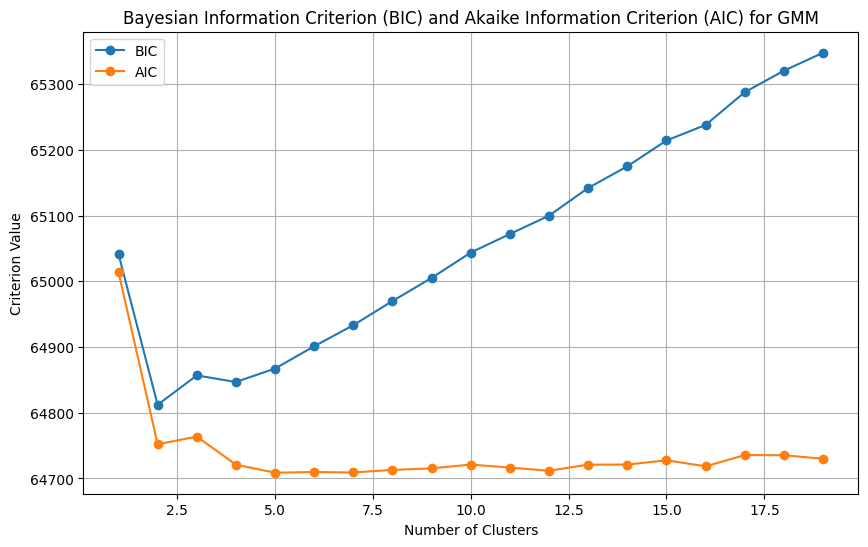

The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - 2
The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - 2


In [39]:
#Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

# Covariance Type = "full"
for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="full", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'full'), According to AIC values is - {optimal_bic_n_components}")

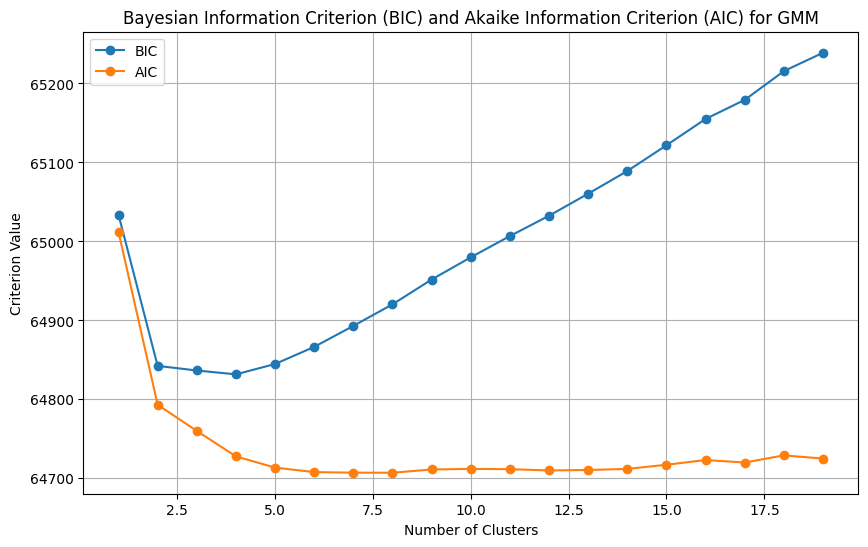

The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to BIC values is - 4
The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to AIC values is - 4


In [40]:
# Covariance Type = "diag"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="diag", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'diag'), According to AIC values is - {optimal_bic_n_components}")

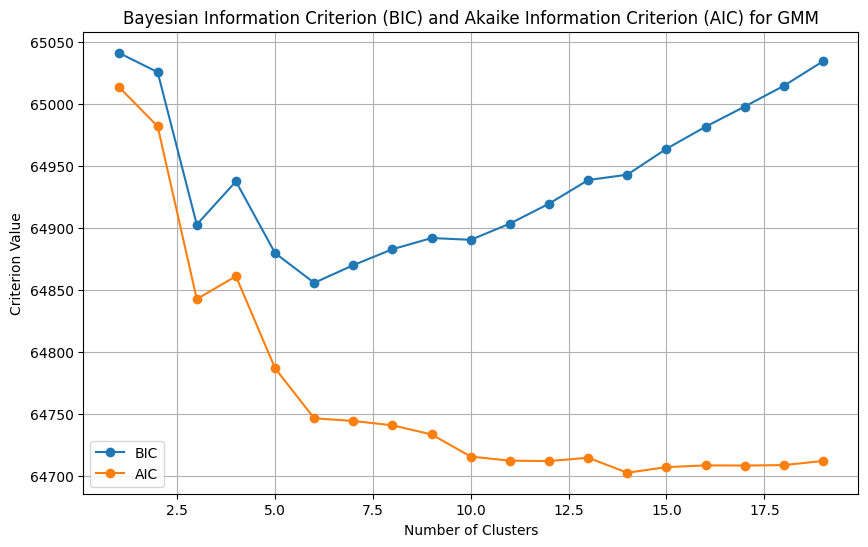

The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to BIC values is - 6
The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to AIC values is - 6


In [41]:
# Covariance Type = "tied"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="tied", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'tied'), According to AIC values is - {optimal_bic_n_components}")

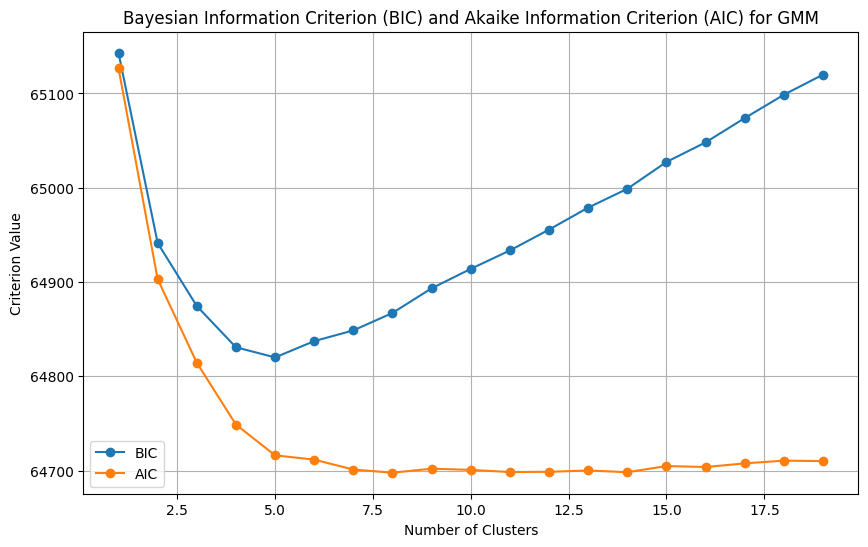

The number of Best Components for Gaussian Mixture (with covariance_type = 'spherical'), According to BIC values is - 5
The number of Best Components for Gaussian Mixture (with covariance_type = 'spherical'), According to AIC values is - 5


In [42]:
# Covariance Type = "spherical"

# Determining the number of optimum Components for the Gaussian Mixture Model
n_components = range(1, 20)
bic_values = []
aic_values = []

for n in n_components:
    GMM = GaussianMixture(n_components=n, n_init=10, covariance_type="spherical", random_state=0)
    GMM.fit(X_reduced)
    bic_values.append(GMM.bic(X_reduced))
    aic_values.append(GMM.aic(X_reduced))

plt.figure(figsize=(10, 6))
plt.plot(n_components, bic_values, marker='o', label='BIC')
plt.plot(n_components, aic_values, marker='o', label='AIC')
plt.xlabel('Number of Clusters')
plt.ylabel('Criterion Value')
plt.title('Bayesian Information Criterion (BIC) and Akaike Information Criterion (AIC) for GMM')
plt.legend()
plt.grid()
plt.show()

# Finding the number of Optimum Components is
optimal_bic_n_components = n_components[np.argmin(bic_values)]
optimal_aic_n_components = n_components[np.argmin(aic_values)]
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'spherical'), According to BIC values is - {optimal_bic_n_components}")
print(f"The number of Best Components for Gaussian Mixture (with covariance_type = 'spherical'), According to AIC values is - {optimal_bic_n_components}")

<H2> Based on the above BIC & AIC graphs, we can see that the optimum number of clusters obtained for different Gaussian Mixture models are -

1. with covariance_type="full" = 2
2. with covariance_type="diag" = 4
3. with covariance_type="tied" = 6
4. with covariance_type="spherical" = 5
</H2>

In [43]:
# Based on the above graph, we choose the optimal number of clusters
gmm_optimal_n_clusters = 2  # Adjust this based on the plot

# Apply K-Means clustering with the optimal number of clusters
GMM = GaussianMixture(n_components=gmm_optimal_n_clusters, n_init=10, random_state=0)
GMM.fit(X_reduced)

print(f"Checking whether the Gaussian Mixture model Converges - {GMM.converged_}")
print(f"\nNumber of iternations that took the Gaussian Mixture took is - {GMM.n_iter_}")
print(f"\nThe weights established by the Gaussian Mixture model are - {GMM.weights_}")
print(f"\nThe means established by the Gaussian Mixture model are -\n {GMM.means_}")
print(f"\nThe covariances established by the Gaussian Mixture model are - \n {GMM.covariances_}")


Checking whether the Gaussian Mixture model Converges - True

Number of iternations that took the Gaussian Mixture took is - 21

The weights established by the Gaussian Mixture model are - [0.49966344 0.50033656]

The means established by the Gaussian Mixture model are -
 [[-1137.31712461   416.15895396]
 [ 1135.78706992  -415.59908729]]

The covariances established by the Gaussian Mixture model are - 
 [[[7687085.43767643  773924.75414326]
  [ 773924.75414326 1412915.98081295]]

 [[7594077.96863172  171816.45032515]
  [ 171816.45032515 8860108.25194947]]]


<H2>(B) Visualize the clusters in a similar way to the visualization after line 28 here: https://github.com/ageron/handson-ml3/blob/main/09_unsupervised_learning.ipynbLinks to an external site., but color each dot based on the clusters it belongs to using the labels taken from the filename as in question 3  (P, R and S). </H2>

In [44]:
# Defining dunctions to plot Gaussian Mixtures
from matplotlib.colors import LogNorm

def plot_gaussian_mixture(clusterer, X, cat, resolution=1000, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = -clusterer.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(xx, yy, Z,
                 norm=LogNorm(vmin=1.0, vmax=30.0),
                 levels=np.logspace(0, 2, 12))
    plt.contour(xx, yy, Z,
                norm=LogNorm(vmin=1.0, vmax=30.0),
                levels=np.logspace(0, 2, 12),
                linewidths=1, colors='k')

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z,
                linewidths=2, colors='r', linestyles='dashed')

    for c in sorted(set(cat)):
        cat_img = X[np.array(cat)==c]
        plt.scatter(cat_img[:, 0], cat_img[:, 1], cmap = c, s=7, label = "Category "+c)
    plot_centroids(clusterer.means_, clusterer.weights_)
    plt.legend(loc='best', fontsize=10)

    plt.xlabel("$x_1$")
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)

plt.figure(figsize=(8, 4))

# # Plotting the graph
# plot_gaussian_mixture(GMM, X_reduced, categories)
# plt.show()

<Figure size 800x400 with 0 Axes>

<Figure size 800x400 with 0 Axes>

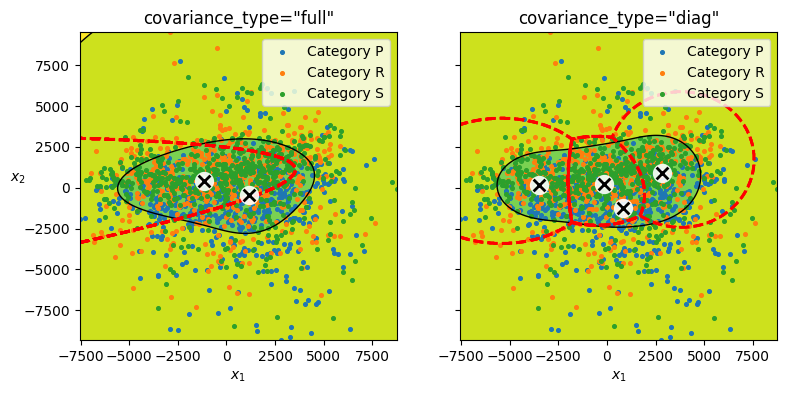

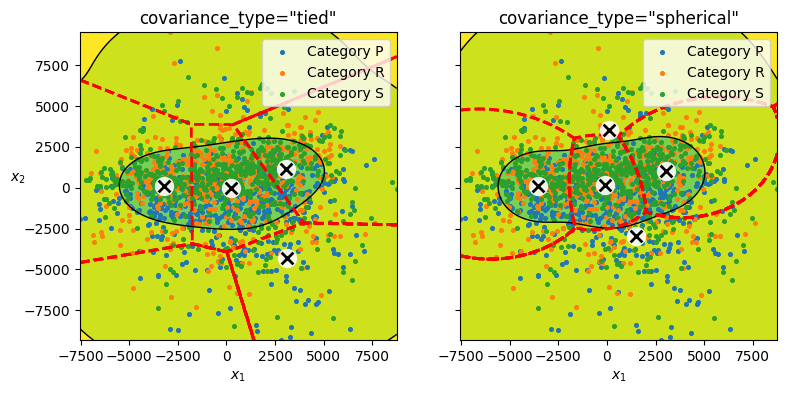

In [45]:
# Plotting Different GM covariance plots
gm_full = GaussianMixture(n_components=2, n_init=10,
                          covariance_type="full", random_state=42)
gm_tied = GaussianMixture(n_components=6, n_init=10,
                          covariance_type="tied", random_state=42)
gm_spherical = GaussianMixture(n_components=5, n_init=10,
                               covariance_type="spherical", random_state=42)
gm_diag = GaussianMixture(n_components=4, n_init=10,
                          covariance_type="diag", random_state=42)
gm_full.fit(X_reduced)
gm_tied.fit(X_reduced)
gm_spherical.fit(X_reduced)
gm_diag.fit(X_reduced)

def compare_gaussian_mixtures(gm1, gm2, X_reduced, categories):
    plt.figure(figsize=(9, 4))

    plt.subplot(121)
    plot_gaussian_mixture(gm1, X_reduced, categories)
    plt.title(f'covariance_type="{gm1.covariance_type}"')

    plt.subplot(122)
    plot_gaussian_mixture(gm2, X_reduced, categories, show_ylabels=False)
    plt.title(f'covariance_type="{gm2.covariance_type}"')

compare_gaussian_mixtures(gm_full, gm_diag, X_reduced, categories)
compare_gaussian_mixtures(gm_tied, gm_spherical, X_reduced, categories)

plt.show()

<H2>

1. From the above graph we can observe that the clustering outcome do not really change based on the 'covariance_type'.
  - Though the number of clusters change, they do not produce a cluster that is distinctly better.
  - Since the clusters are not better, I choose the covariance_type='tied' with optimum clusters=4 to generate samples in the following question.
  - 'Covariance_type' = "tied" is selected as 4 optimum clusters looks better, in-terms of clustering data-points
2. Neither the EM or kmeans graph cluster well, cause 72% variance is lost by reducing the data to only 2 principle components in PCA.
</H2>

<H2>(C) Use the model to generate 20 new rocks (using the sample() method), and visualize them in the original image space (since you used PCA, you will need to use its inverse_transform() method).</H2>

In [46]:
# Running the Gaussian Mixture with the Optimum Clusters
GMM = GaussianMixture(n_components=4, n_init=10, covariance_type="tied", random_state=0)
GMM.fit(X_reduced)

# Using the Sample method to generate 20 images
n_samples = 20
sample_20, sample_y = GMM.sample(n_samples)
sample_20


array([[ 6874.32323957, -2261.73279077],
       [ 6955.4178847 ,   698.98283859],
       [ 1373.92569326,  2888.40675018],
       [ 3141.37738906,  6195.85083457],
       [ 3722.05607027,  2183.87432308],
       [ -805.72438344,   446.58772366],
       [-2566.75913285,  -626.30546805],
       [-1993.71884328, -1610.95739976],
       [-2171.01812054,   363.96199269],
       [-3153.49746379, -3295.10632586],
       [ -590.22749019,   404.90953291],
       [-2975.38189663,  -698.17585548],
       [ 1609.29033493,  3899.42144307],
       [  -86.24373293,  1406.20719399],
       [ 3124.43196885,  -740.2234579 ],
       [-2125.47759246,  3132.02100939],
       [ -837.95609544,   313.83167456],
       [ 1868.68297212, -1238.08653148],
       [ -974.52736879,  -891.98034178],
       [-1750.68437309, -4034.0589282 ]])

In [47]:
# Inversing the Sample Images extracted to the original size
X_recovered = pca.inverse_transform(sample_20)
X_recovered = X_recovered.reshape(n_samples, 100, 150, 3)
print(f"Recovered Size = {X_recovered.shape}")

Recovered Size = (20, 100, 150, 3)


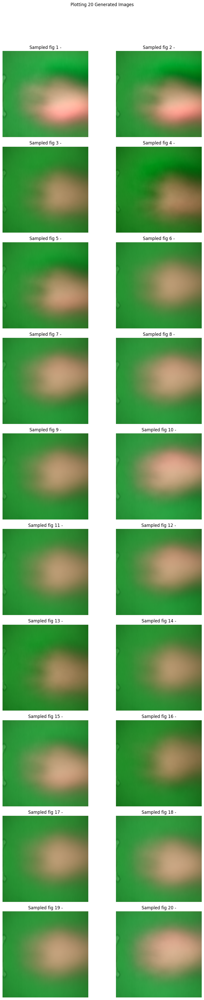

In [48]:
# Visualizing the Generated Images

num_images_to_plot = len(X_recovered)

# Determining the number of rows and columns dynamically
rows = int(math.ceil(num_images_to_plot / 2))
cols = 2

#Adjusting individual image sizes in the plot
image_size = 4

# Create a 10x2 grid for displaying images
fig, axes = plt.subplots(rows, cols, figsize=(10, rows*4))

# Plotting the reconstructed images generated by GMM
a = 0
for i in range(rows):
    for j in range(cols):
        if a < num_images_to_plot:
            reconstructed_image = X_recovered[a].reshape(100, 150, 3)
            axes[i,j].imshow(reconstructed_image.astype(int), extent=[0, image_size, 0, image_size])
            axes[i,j].set_title(f"Sampled fig {a+1} -")
            axes[i,j].axis("off")
            a = a + 1
        else:
            axes[i, j].axis("off")

plt.suptitle("Plotting 20 Generated Images")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


<H1>Question 7</H1>

In [51]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras import layers, models, optimizers
import time
from tensorflow.keras.layers import BatchNormalization

train_data_dir = '/content/extracted_images/train'
valid_data_dir = '/content/extracted_images/test'

batch_size = 32

# Custom data generator
class CustomDataGenerator(keras.utils.Sequence):
    def __init__(self, data_dir, batch_size, input_shape, shuffle=True):
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.input_shape = input_shape
        self.shuffle = shuffle

        # Get a list of all image files in the data directory
        self.image_files = [f for f in os.listdir(data_dir) if f.endswith('.png')]

        self.indices = np.arange(len(self.image_files))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __len__(self):
        return int(np.ceil(len(self.indices) / self.batch_size))

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

        X = np.zeros((len(batch_indices), *self.input_shape))
        y = []

        for i, idx in enumerate(batch_indices):
            image_path = os.path.join(self.data_dir, self.image_files[idx])
            image = tf.keras.preprocessing.image.load_img(image_path, target_size=self.input_shape)
            image = tf.keras.preprocessing.image.img_to_array(image)
            image = image / 255.0  # Normalize pixel values to [0, 1]
            X[i] = image

            # Extract the class label from the image filename (e.g., "I_image1.jpg" -> "I")
            class_label = self.image_files[idx].split('_')[0]
            y.append(class_label)

        # Convert class labels to unique integers
        unique_labels = list(set(y))
        print(unique_labels)
        label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
        y = [label_mapping[label] for label in y]

        return X, keras.utils.to_categorical(y, num_classes=3)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# Define input shape
input_shape = (200, 300, 3)  # Adjust to match your image dimensions

# Create custom data generators
train_generator = CustomDataGenerator(train_data_dir, batch_size, input_shape)
validation_generator = CustomDataGenerator(valid_data_dir, batch_size, input_shape, shuffle=False)

In [58]:
# Buildin the Sequential model

epochs = 20 #50
learning_rate = 0.0001 #0.0001

# model = models.Sequential()
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape =[200, 300, 3]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(100,activation="relu",kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(50,activation="relu",kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(8,activation="relu",name="intermediate_layer"),
    tf.keras.layers.Dense(3,activation="softmax")
])

# Compiling the model
model.compile(
    optimizer=optimizers.Adam(learning_rate),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

start_time = time.time()

# Training the model
history = model.fit(
    train_generator,
    epochs=epochs,
    steps_per_epoch=len(train_generator),
    validation_data=validation_generator,  # Include validation data
    validation_steps=len(validation_generator)  # Number of validation steps
)

# Record the end time
end_time = time.time()

# Evaluate the model on validation data
val_loss, val_accuracy = model.evaluate(validation_generator)
print(f'Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}')

['S', 'R', 'P']
Epoch 1/20
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
55/55 [==============================] - ETA: 0s - loss: 3.4310 - accuracy: 0.6609['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
55/55 [==============================] - 17s 259ms/step - loss: 3.4310 - accuracy: 0.6609 - val_loss: 3.5335 - val_accuracy: 0.4852
Epoch 2/20
['S', 'R', 'P']
55/55 [==============================] - ETA: 0s - loss: 2.8813 - accuracy: 0.8776['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
['S', 'R', 'P']
55/55 [==============================] - 9s 161ms/step - loss: 2.8813 - accuracy: 0.8776 - val_loss: 3.2515 - val_accuracy: 0.5786
Epoch 3

<H2> (A) Report the training time (use code to do this). </H2>

In [59]:
# Calculating and reporting the training time
training_time_seconds = end_time - start_time
print(f"The time it took to train the model (in seconds) is: {training_time_seconds:.2f} seconds")

The time it took to train the model (in seconds) is: 193.41 seconds


<H2>(B) Plot training and validation loss and accuracy as a function of training epochs. </H2>

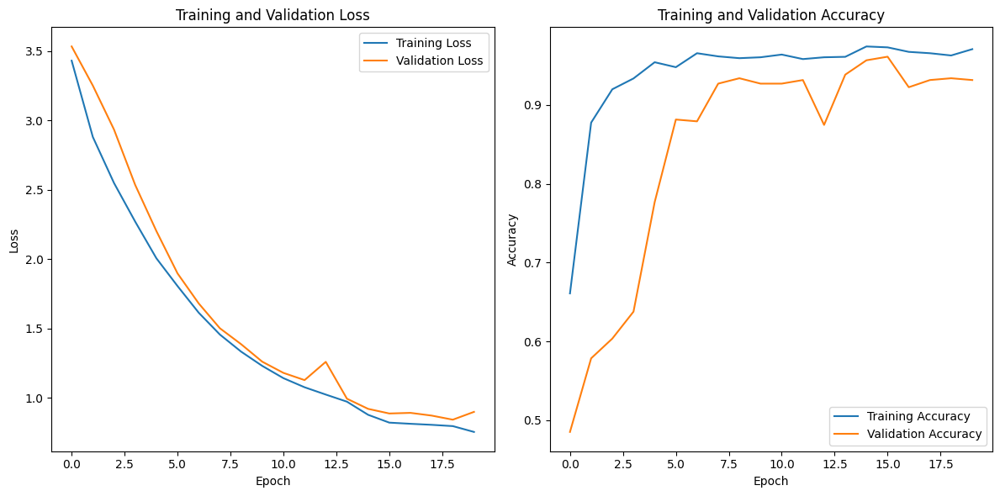

In [60]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

<H1> Answer - </H1>
<H2>

1. As seen from the graphs above -

  - The training and validation loss decreases as more epochs are trained.
  - The training and validation accuracy of the model increases as more models are trained.
  
2. As seen from the above graph, the model overfits the data a bit. Overfitting could be resolved by further tuning the hyperparameters.
</H2>

<H2>(C) How many parameters does the network have? How many of those parameters are bias parameters?</H2>

In [61]:
model.summary()
print("="*100)

total_parameters = model.count_params()
print(f'\nTotal number of parameters: {total_parameters}')

# Extracting and displaying total bias parameters
total_bias_parameters = 0
for layer in model.layers:
    if hasattr(layer, 'get_weights'):
        weights = layer.get_weights()
        if len(weights) > 1:  # Check if the layer has bias parameters
            total_bias_parameters += weights[1].size

print(f"Total number of Bias Parameters: {total_bias_parameters}")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 180000)            0         
                                                                 
 batch_normalization_6 (Bat  (None, 180000)            720000    
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 100)               18000100  
                                                                 
 batch_normalization_7 (Bat  (None, 100)               400       
 chNormalization)                                                
                                                                 
 dense_7 (Dense)             (None, 50)                5050      
                                                                 
 batch_normalization_8 (Bat  (None, 50)               

In [62]:
# Displaying the number of Bias Parameters per layer
from tensorflow.keras.models import load_model

print(f"For every layer the model has the following bias parameters - ")
# Iterate through layers and print bias parameters
for layer in model.layers:
    if hasattr(layer, 'get_weights') and len(layer.get_weights()) > 0:
        all_weights = layer.get_weights()
        biases = all_weights[-1]  # Last element is assumed to be biases

        if biases is not None:
            print(f'\tLayer: {layer.name}, Bias parameters: {biases.shape[0]}')

For every layer the model has the following bias parameters - 
	Layer: batch_normalization_6, Bias parameters: 180000
	Layer: dense_6, Bias parameters: 100
	Layer: batch_normalization_7, Bias parameters: 100
	Layer: dense_7, Bias parameters: 50
	Layer: batch_normalization_8, Bias parameters: 50
	Layer: intermediate_layer, Bias parameters: 8
	Layer: dense_8, Bias parameters: 3


<H2>(D) - Not required for Personal Dataset </H2>